# Compresión de imagenes.

## Aplicaciones de la descomposición en valores singulares.

La descomposición en valores singulares de una matriz $A$ es la factorización de $A$ como el producto de dos o más matrices de tal forma que sus factores satisfagan ciertas propuiedades deseadas, según el problema a resolver. En particualr es común que se busque una factorización cómo la siguiente $A=UDV^T$ donde las columnas de $U$ y $V$ son ortonormales, y la matriz D es Diagonal con entradas positivas y relaes <!--(como Wu-Tang Clan)-->

Es usual procede factorizando la matriz en el producto de matrices triangulares, sea el caso de $LU$ y sus variantes ($LDU,LUP,LL^T$) para resolver ecuaciones lineales como: $Ax=b$ dónde $A\in\mathbb{R}^{n\times n}$ es una matriz cuadrada  y $b\in\mathbb{R}^n$ es un vector. Diremos que $L$ es una matriz triangular inferior con $1$s en la diagonal y $U$ es una matriz triangular superior


In [31]:
from __future__ import division
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from pylab import *
#import mahotas
%matplotlib inline

In [32]:
#Cargamos la imagen sobre la que aplicaremos el método como una variable
imagen = np.array(Image.open('test.jpg'))

In [33]:
#print imagen,"\n"
imagen = imagen / 255
#print imagen
#Normalizamos la imagen
row, col, _ = imagen.shape
print "pixels: ", row, "*", col

pixels:  1000 * 1600


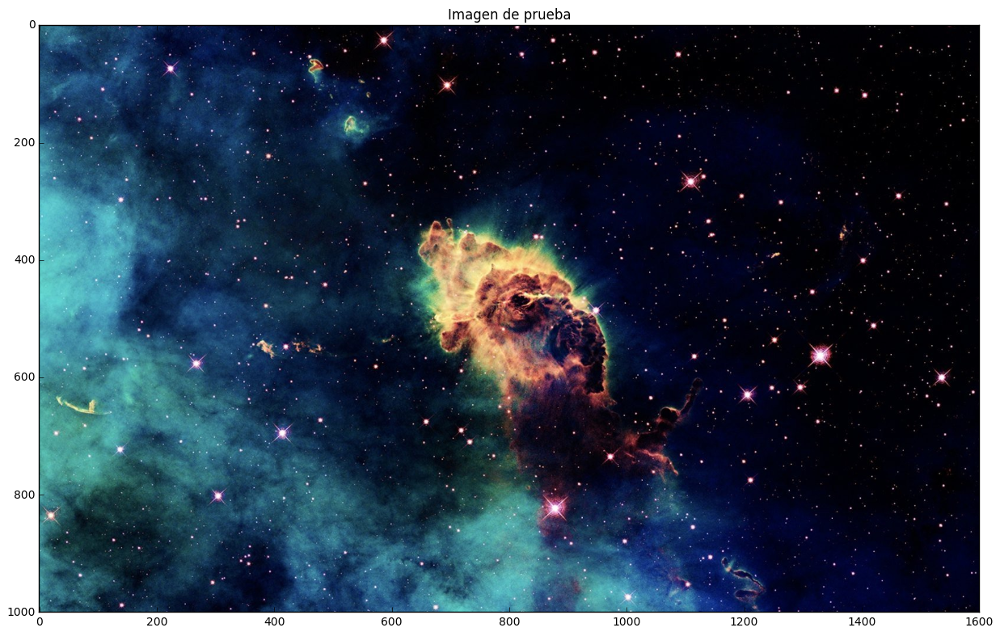

In [34]:
fig = plt.figure(figsize=(15, 10))
a = fig.add_subplot(1, 1, 1)
imgplot = plt.imshow(imagen)
a.set_title('Imagen de prueba')
plt.show()

In [35]:
imagenCanalRojo = imagen[:, :, 0]
imagenCanalVerde = imagen[:, :, 1]
imagenCanalAzul = imagen[:, :, 2]

In [36]:
originalBytes = imagen.nbytes
print "El espacio necesario para almacenar la imagen (en bytes) es:", (originalBytes/1000)/1000

El espacio necesario para almacenar la imagen (en bytes) es: 38.4


In [37]:
#Donde R=Red, G=Green y B=Blue
U_r, d_r, V_r = np.linalg.svd(imagenCanalRojo, full_matrices=True)
U_g, d_g, V_g = np.linalg.svd(imagenCanalVerde, full_matrices=True)
U_b, d_b, V_b = np.linalg.svd(imagenCanalAzul, full_matrices=True)

In [38]:
bytesParaAlmacenar = sum([matrix.nbytes for matrix in [U_r, d_r, V_r, U_g, d_g, V_g, U_b, d_b, V_b]])
print "Las matrices que almacenaremos tiene el tamaño de (en bytes):",(bytesParaAlmacenar/1000)/1000
print "La diferencia de tamaño es:", ((originalBytes-bytesParaAlmacenar)/1000)/1000

Las matrices que almacenaremos tiene el tamaño de (en bytes): 85.464
La diferencia de tamaño es: -47.064


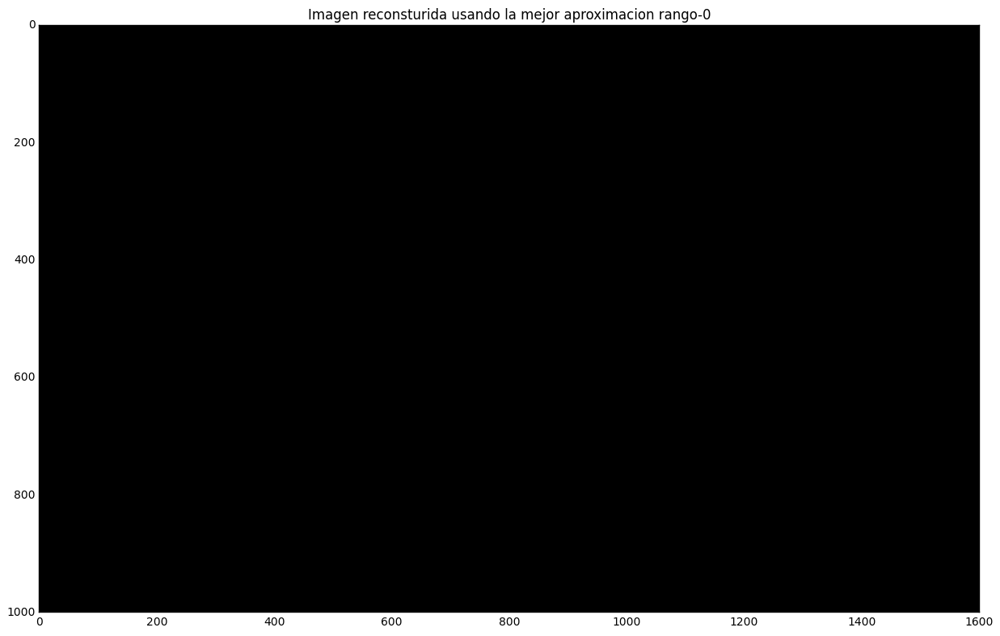

Las matrices comprimidas que almacenamos ahora pesan (en MB): 0.0
La diferencia de tamaño respecto a la imagen es: 38.4
La diferencia de tamaño respecto a la matriz es: 85.464
El procentaje de compresión es de 100 %


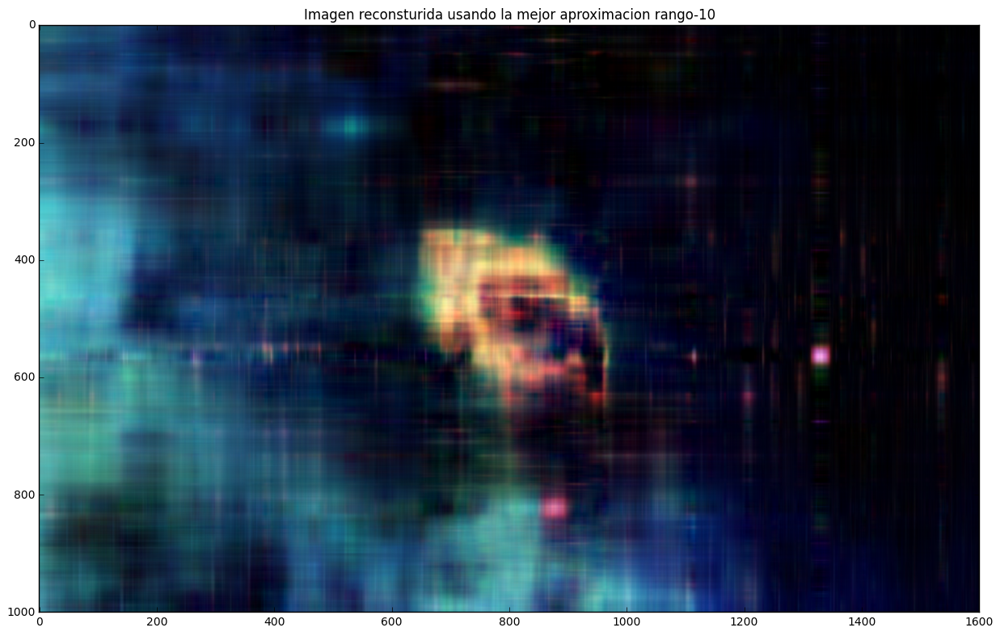

Las matrices comprimidas que almacenamos ahora pesan (en MB): 0.62424
La diferencia de tamaño respecto a la imagen es: 37.77576
La diferencia de tamaño respecto a la matriz es: 84.83976
El procentaje de compresión es de 61.5148019992 %


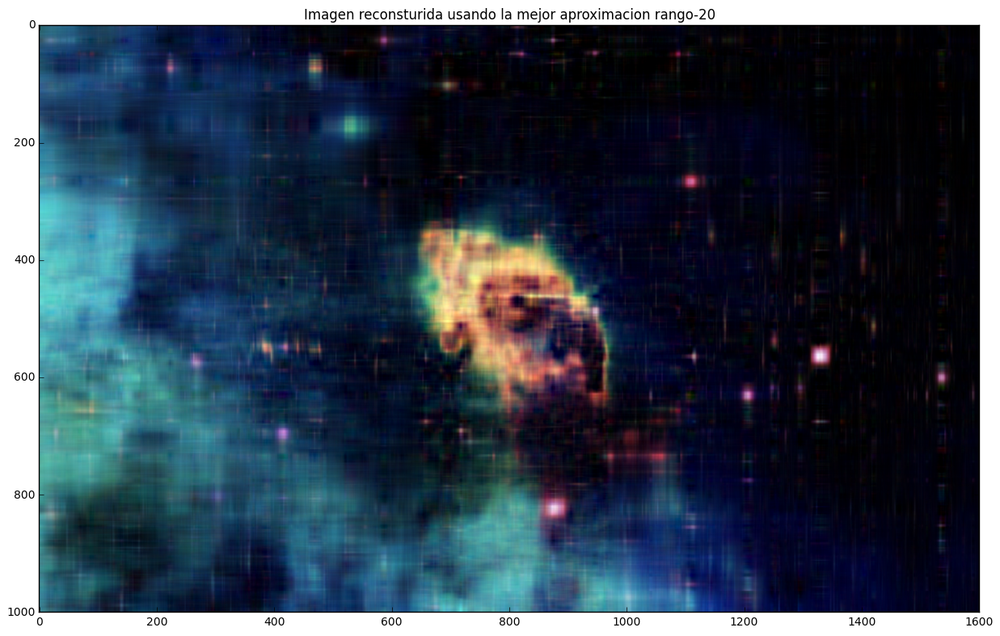

Las matrices comprimidas que almacenamos ahora pesan (en MB): 1.24848
La diferencia de tamaño respecto a la imagen es: 37.15152
La diferencia de tamaño respecto a la matriz es: 84.21552
El procentaje de compresión es de 30.7574009996 %


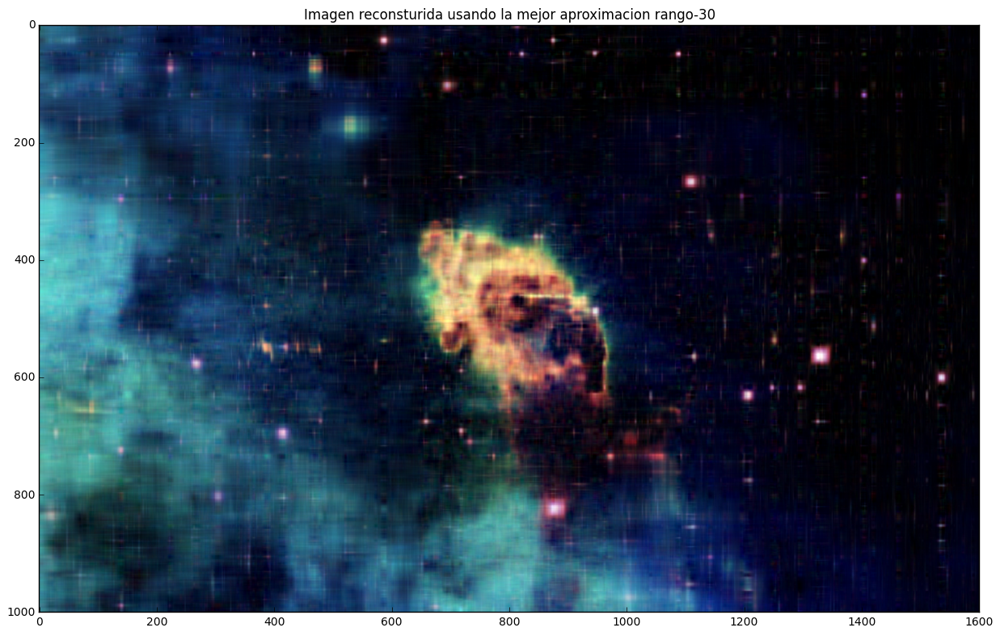

Las matrices comprimidas que almacenamos ahora pesan (en MB): 1.87272
La diferencia de tamaño respecto a la imagen es: 36.52728
La diferencia de tamaño respecto a la matriz es: 83.59128
El procentaje de compresión es de 20.5049339997 %


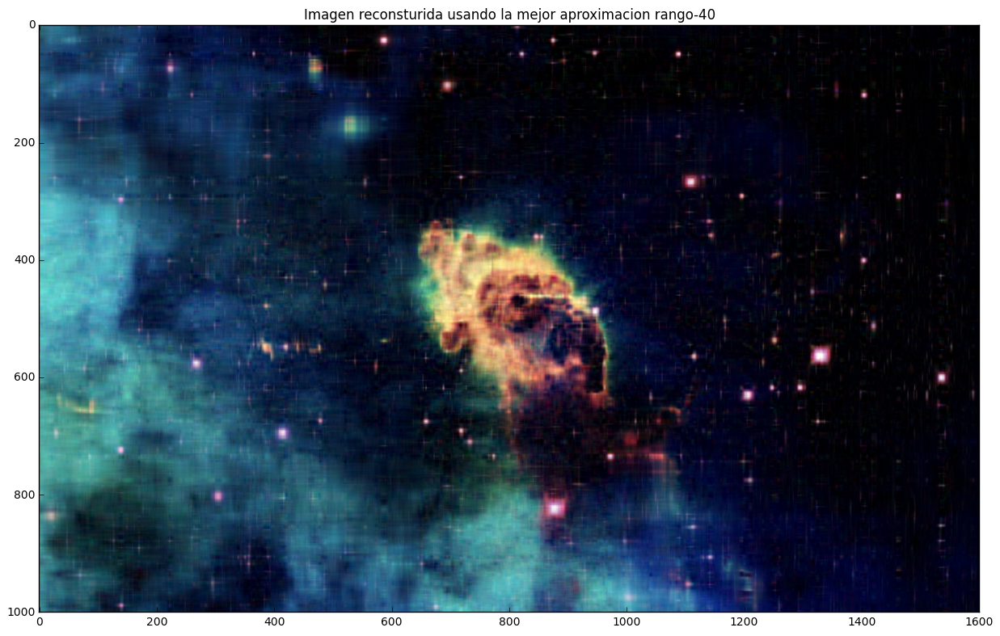

Las matrices comprimidas que almacenamos ahora pesan (en MB): 2.49696
La diferencia de tamaño respecto a la imagen es: 35.90304
La diferencia de tamaño respecto a la matriz es: 82.96704
El procentaje de compresión es de 15.3787004998 %


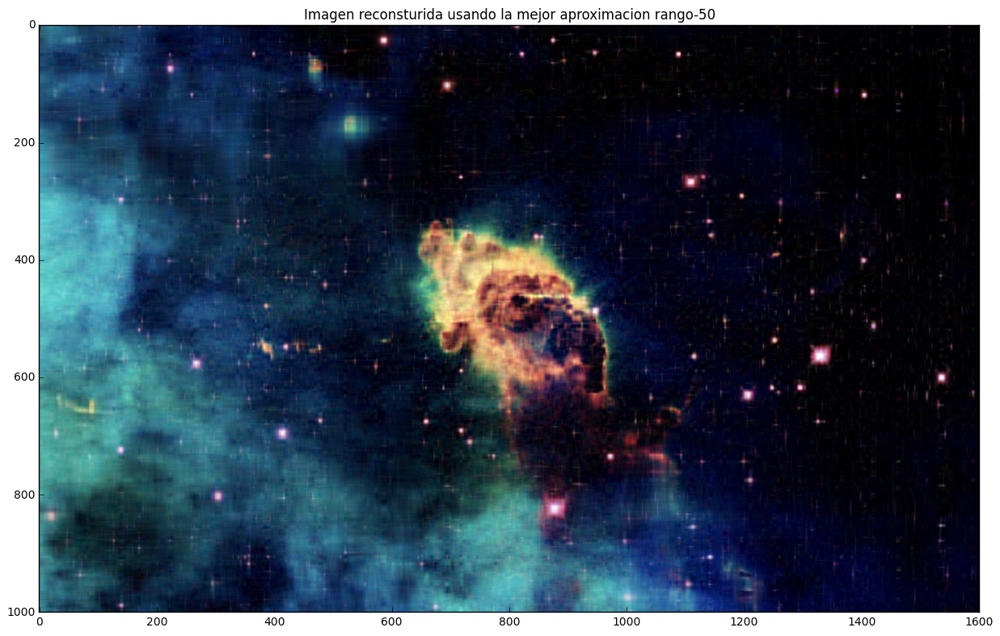

Las matrices comprimidas que almacenamos ahora pesan (en MB): 3.1212
La diferencia de tamaño respecto a la imagen es: 35.2788
La diferencia de tamaño respecto a la matriz es: 82.3428
El procentaje de compresión es de 12.3029603998 %


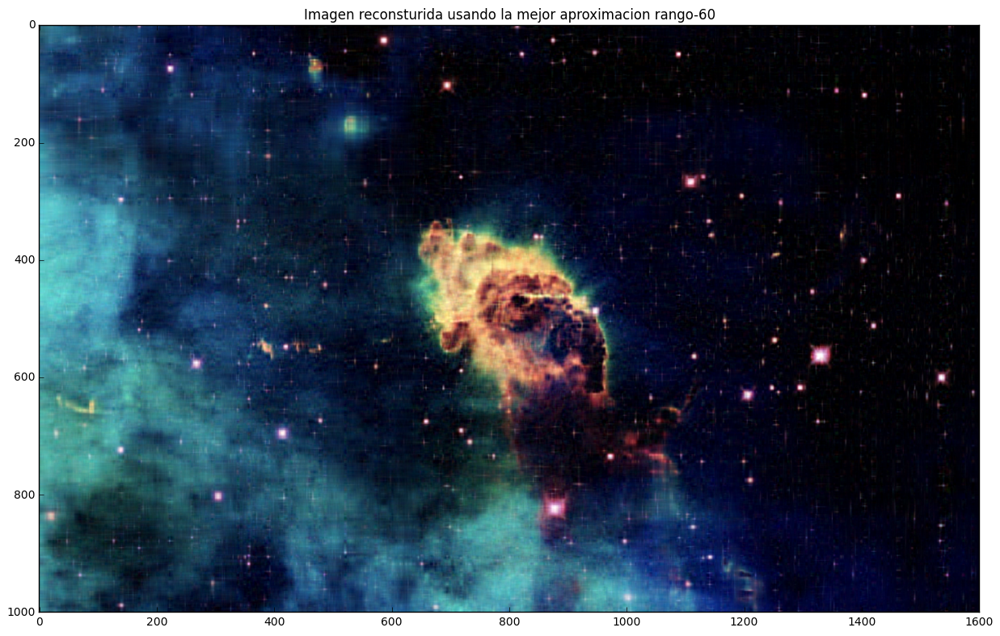

Las matrices comprimidas que almacenamos ahora pesan (en MB): 3.74544
La diferencia de tamaño respecto a la imagen es: 34.65456
La diferencia de tamaño respecto a la matriz es: 81.71856
El procentaje de compresión es de 10.2524669999 %


In [ ]:
k=0
N=range(0,200,10)
sol = zeros(len(N))
colums = zeros(len(N))
tamanio = zeros(len(N))
#sol = zeros((len(range(0,200,10)))
i=0
            
for k in N:
            
    U_r_k = U_r[:, 0:k]
    V_r_k = V_r[0:k, :]
    U_g_k = U_g[:, 0:k]
    V_g_k = V_g[0:k, :]
    U_b_k = U_b[:, 0:k]
    V_b_k = V_b[0:k, :]

    d_r_k = d_r[0:k]
    d_g_k = d_g[0:k]
    d_b_k = d_b[0:k]

    image_red_approx = np.dot(U_r_k, np.dot(np.diag(d_r_k), V_r_k))
    image_green_approx = np.dot(U_g_k, np.dot(np.diag(d_g_k), V_g_k))
    image_blue_approx = np.dot(U_b_k, np.dot(np.diag(d_b_k), V_b_k))

    image_reconstructed = np.zeros((row, col, 3))
    image_reconstructed[:, :, 0] = image_red_approx
    image_reconstructed[:, :, 1] = image_green_approx
    image_reconstructed[:, :, 2] = image_blue_approx
    image_reconstructed[image_reconstructed < 0] = 0
    image_reconstructed[image_reconstructed > 1] = 1
    
    fig = plt.figure(figsize=(15, 10))
    a = fig.add_subplot(1, 1, 1)
    imgplot = plt.imshow(image_reconstructed)
    a.set_title('Imagen reconsturida usando la mejor aproximacion rango-{}'.format(k))
    plt.show()
    bytesComprimidos = sum([matrix.nbytes for matrix in 
                        [U_r_k, d_r_k, V_r_k, U_g_k, d_g_k, V_g_k, U_b_k, d_b_k, V_b_k]])
    print "Las matrices comprimidas que almacenamos ahora pesan (en MB):", (bytesComprimidos/1000)/1000
    print "La diferencia de tamaño respecto a la imagen es:",((originalBytes - bytesComprimidos)/1000)/1000
    print "La diferencia de tamaño respecto a la matriz es:",((bytesParaAlmacenar-bytesComprimidos)/1000)/1000
    if bytesComprimidos !=0:
        razon = originalBytes/bytesComprimidos
    else:
        razon = 100
    print "El procentaje de compresión es de", razon,"%"
    sol[i]=(bytesComprimidos/1000)/1000
    tamanio[i]=(originalBytes/1000)/1000
    colums[i]=k
    i = i +1
    
plot(sol,colums,"o")
plot(tamanio)
#xlabl("K=columnas")
#ylabl("Peso en MB")
show()
